In [2]:
# Imports; using Python 3.11.0
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import pandas as pd

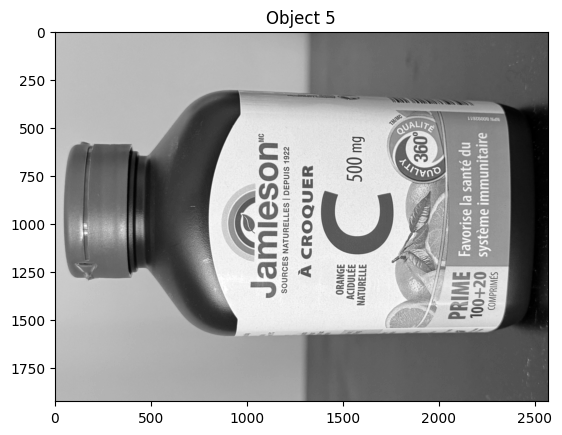

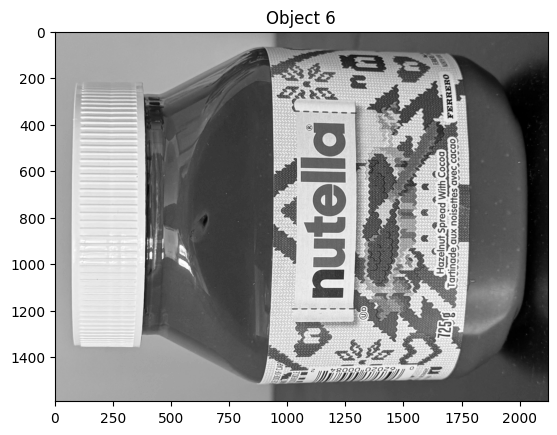

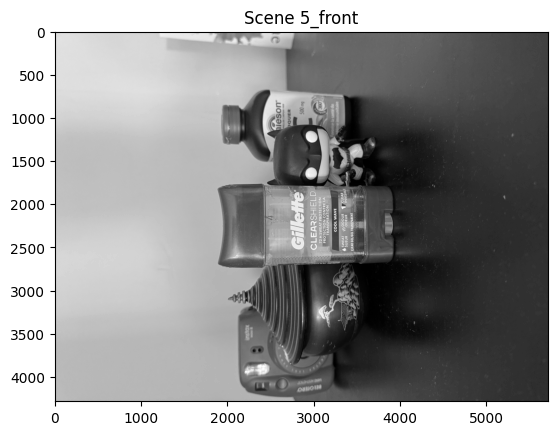

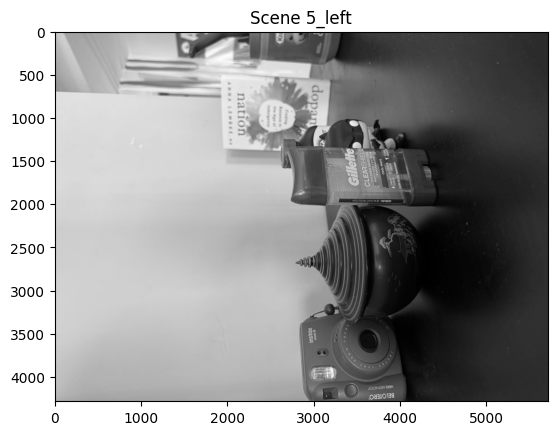

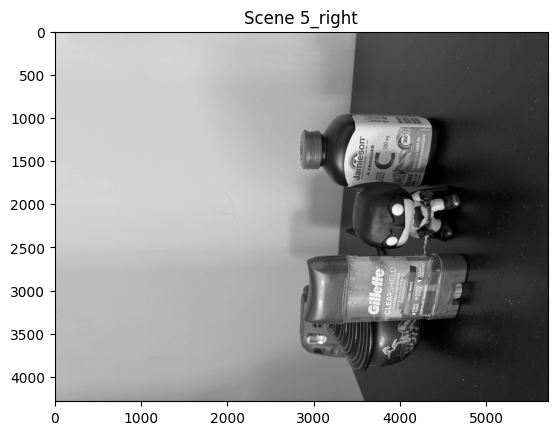

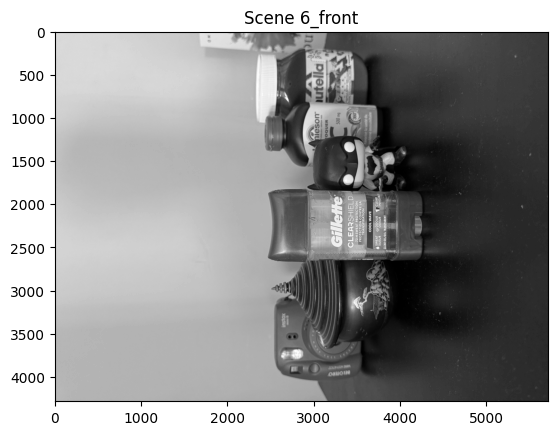

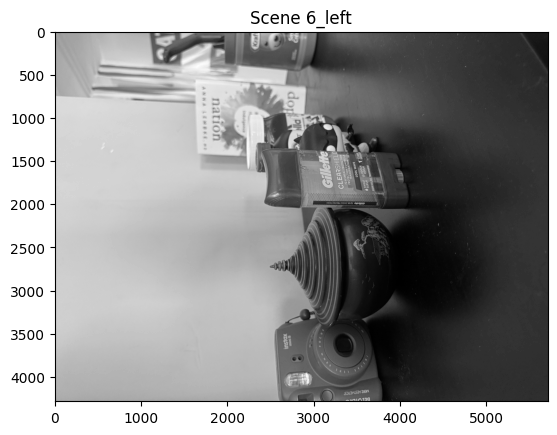

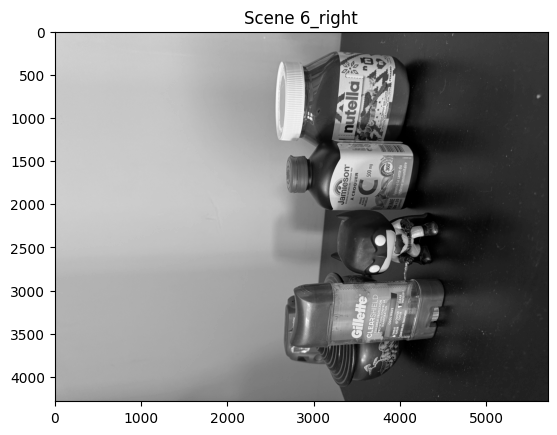

In [21]:
# Show a couple example object & scene images
for i in range(5,7):
    img = cv2.imread(f'../Objects/O{i}.jpg', cv2.IMREAD_GRAYSCALE)
    #img = cv2.resize(img, (320,240)) # maintain 4:3
    #img = cv2.equalizeHist(img) # equalize image to improve contrast
    #img = cv2.GaussianBlur(img, (3,3), 1) # blur to remove noise
    plt.imshow(img, cmap='gray')
    plt.title(f'Object {i}')
    plt.show()
for i in range(5,7):
    for j in ['front', 'left', 'right']:
        img = cv2.imread(f'../Scenes/S{i}_{j}.jpg', cv2.IMREAD_GRAYSCALE)
        plt.imshow(img, cmap='gray')
        plt.title(f'Scene {i}_{j}')
        plt.show()

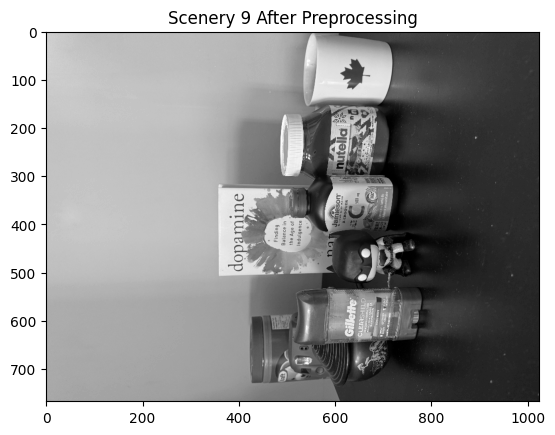

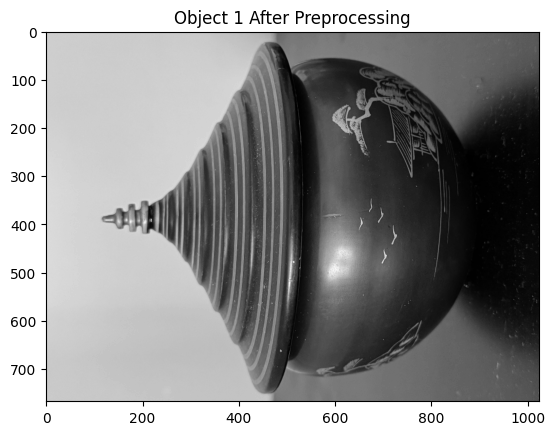

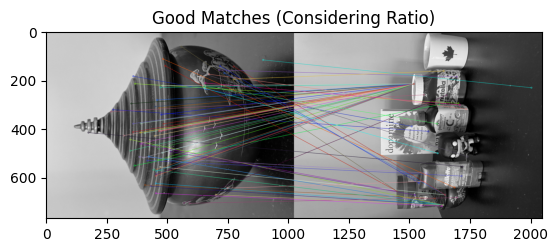

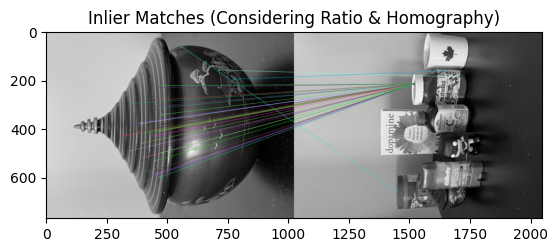

Total Keypoints: 897, Good Matches: 70, Inliers: 33, Inlier Ratio: 0.47, Match Ratio: 0.08


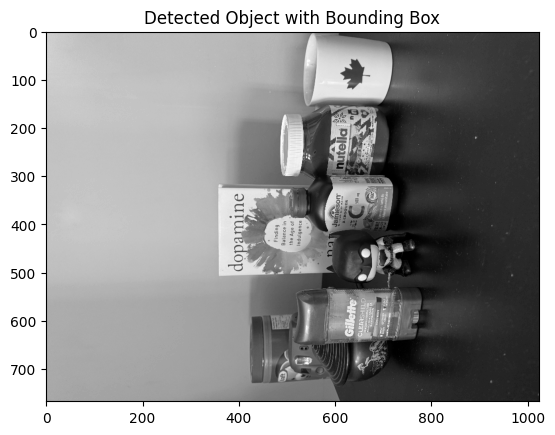

Object detected: False


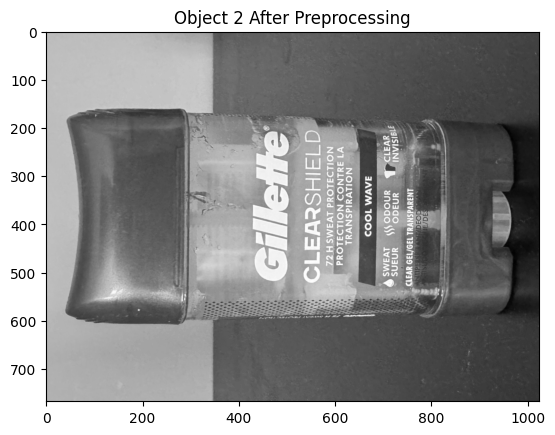

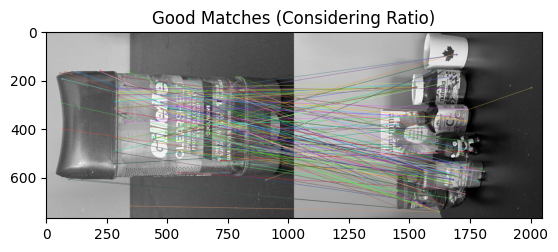

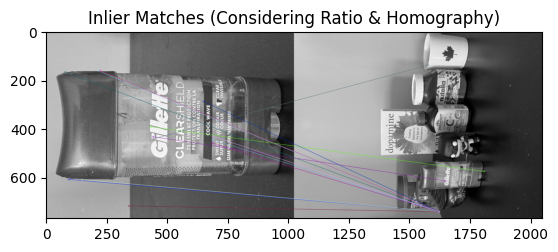

Total Keypoints: 2832, Good Matches: 137, Inliers: 13, Inlier Ratio: 0.09, Match Ratio: 0.05


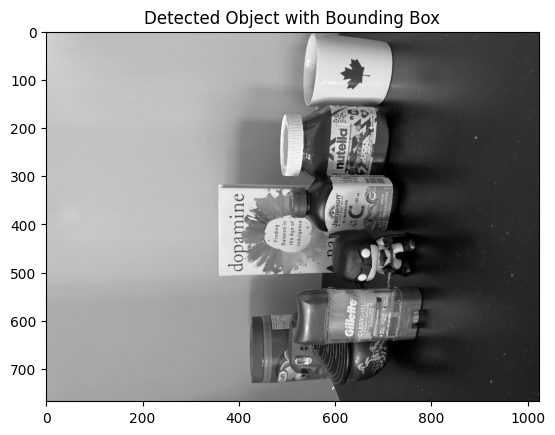

Object detected: True


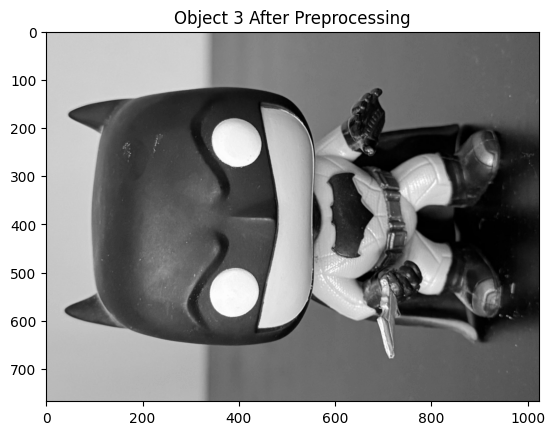

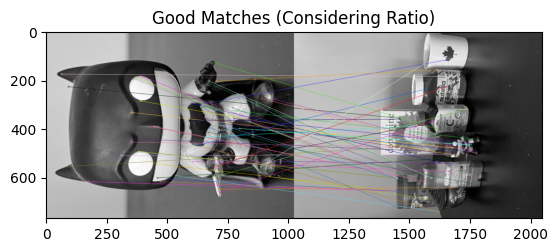

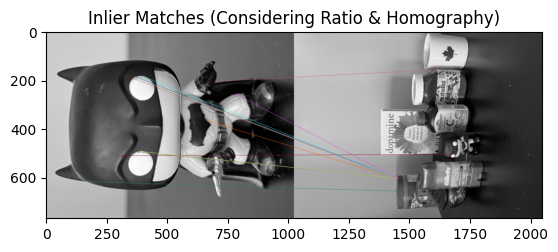

Total Keypoints: 1033, Good Matches: 55, Inliers: 11, Inlier Ratio: 0.20, Match Ratio: 0.05


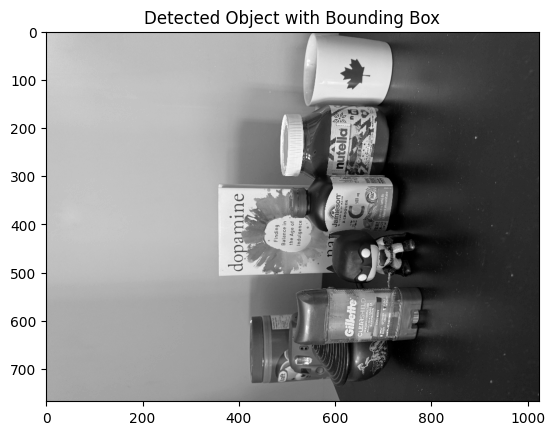

Object detected: False


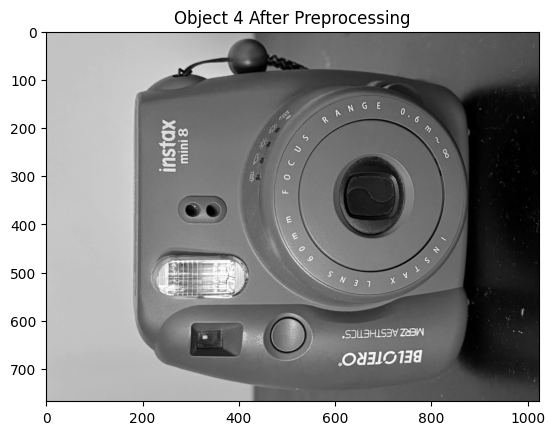

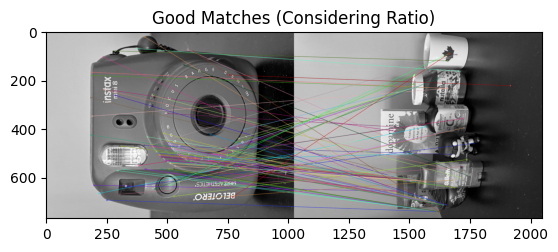

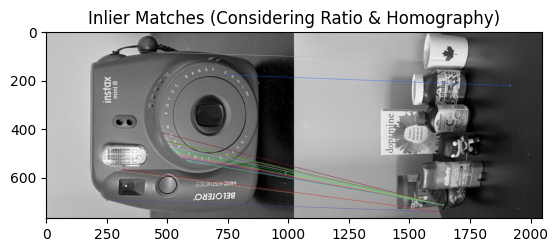

Total Keypoints: 1249, Good Matches: 90, Inliers: 20, Inlier Ratio: 0.22, Match Ratio: 0.07


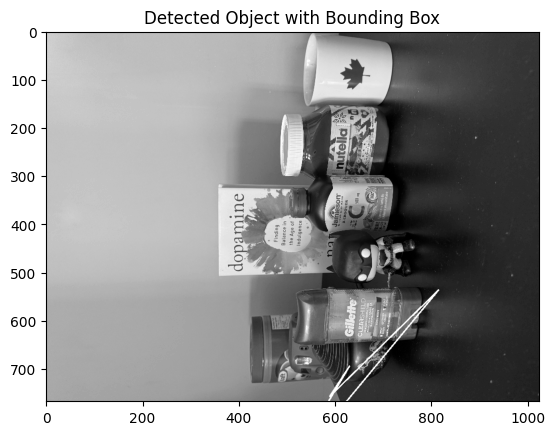

Object detected: False


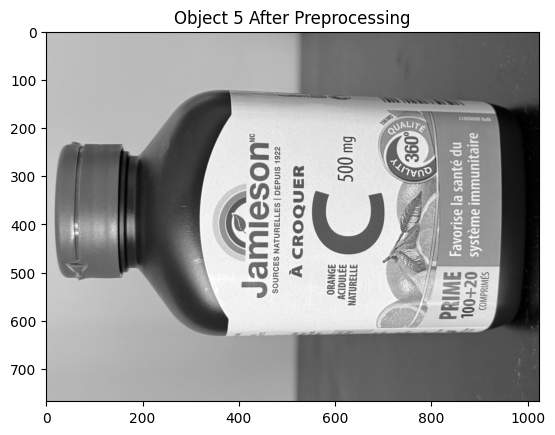

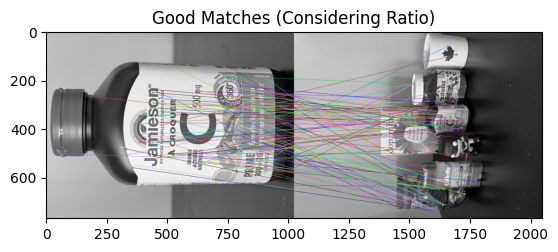

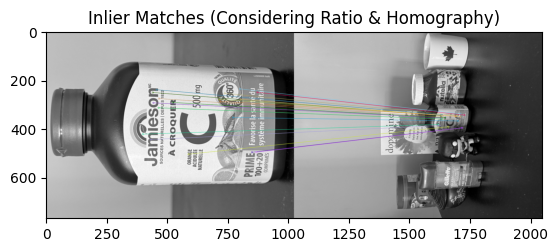

Total Keypoints: 2150, Good Matches: 119, Inliers: 22, Inlier Ratio: 0.18, Match Ratio: 0.06


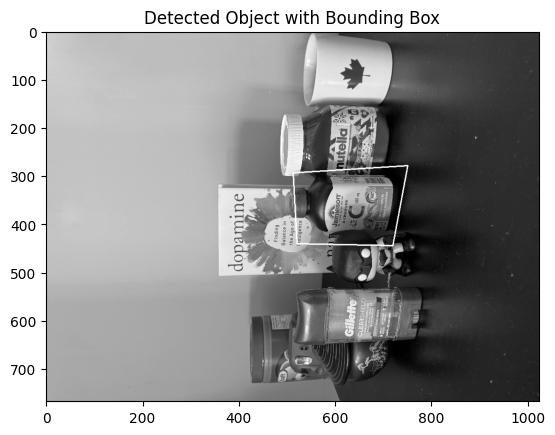

Object detected: True


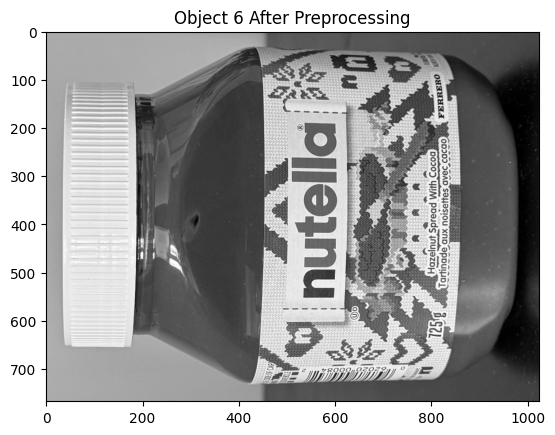

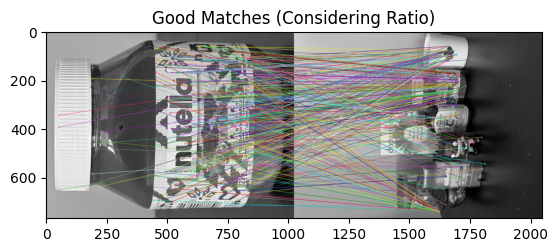

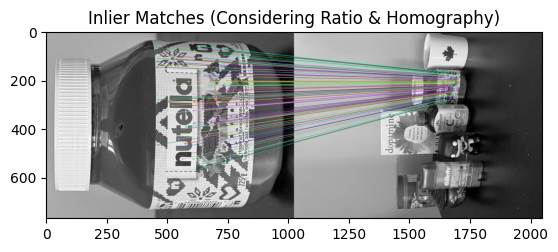

Total Keypoints: 6975, Good Matches: 352, Inliers: 104, Inlier Ratio: 0.30, Match Ratio: 0.05


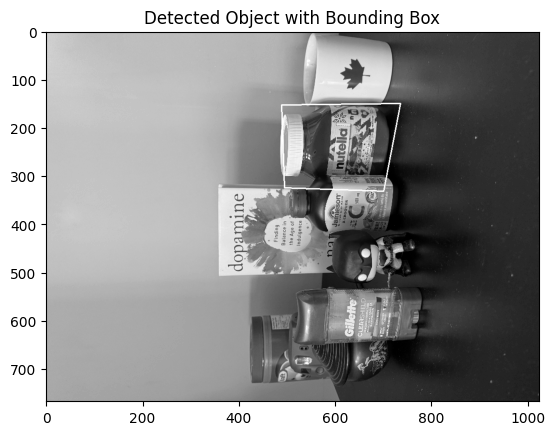

Object detected: True


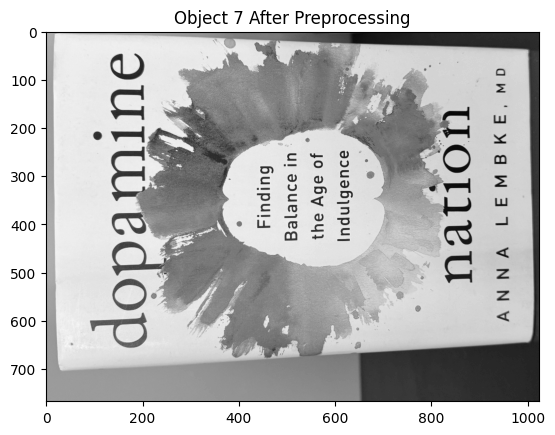

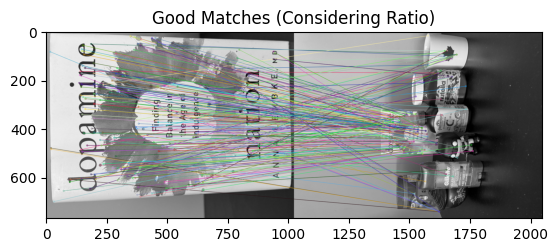

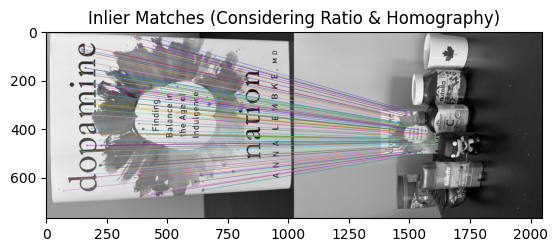

Total Keypoints: 1885, Good Matches: 262, Inliers: 124, Inlier Ratio: 0.47, Match Ratio: 0.14


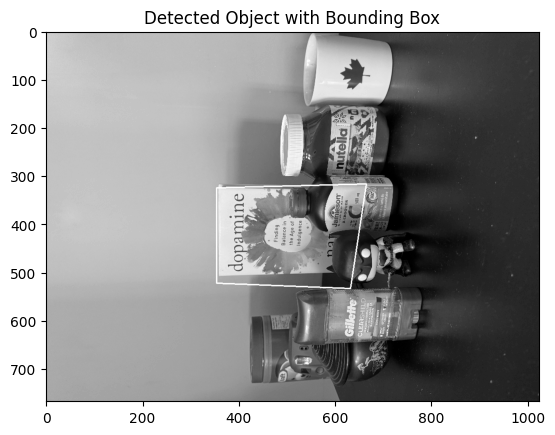

Object detected: True


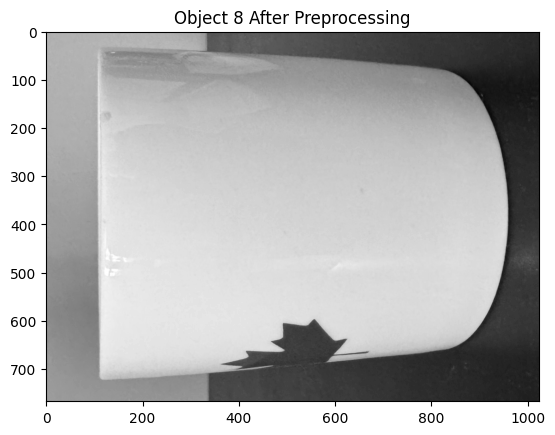

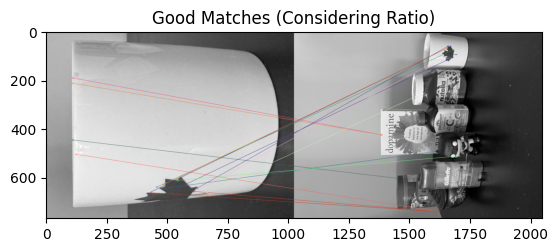

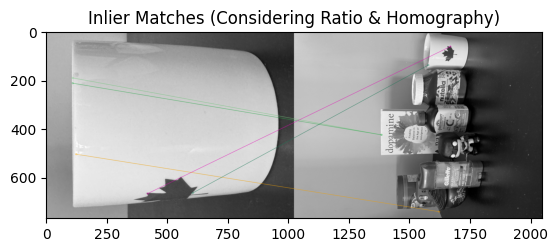

Total Keypoints: 90, Good Matches: 15, Inliers: 5, Inlier Ratio: 0.33, Match Ratio: 0.17


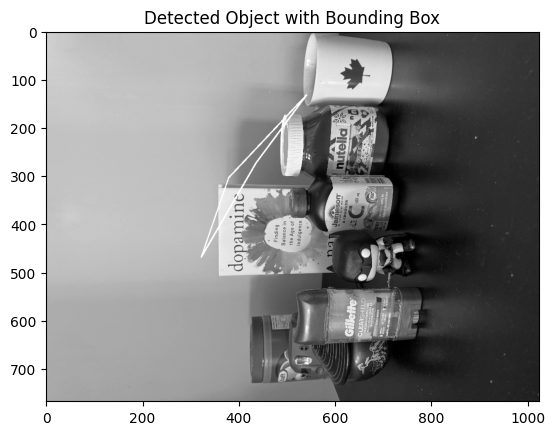

Object detected: True


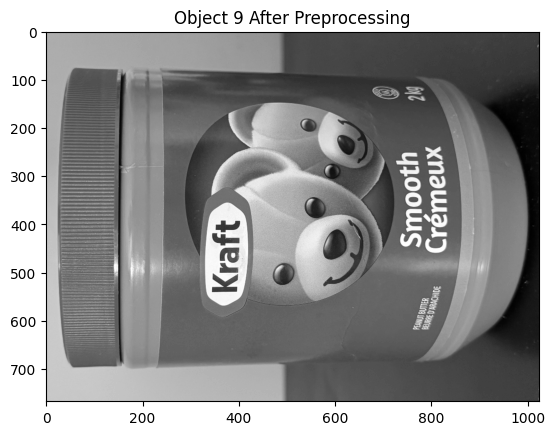

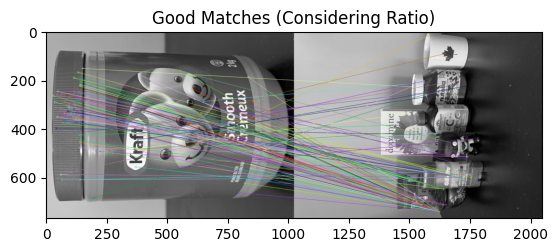

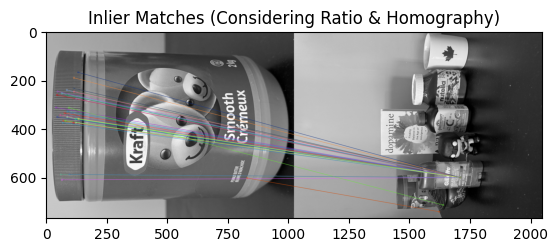

Total Keypoints: 1499, Good Matches: 132, Inliers: 32, Inlier Ratio: 0.24, Match Ratio: 0.09


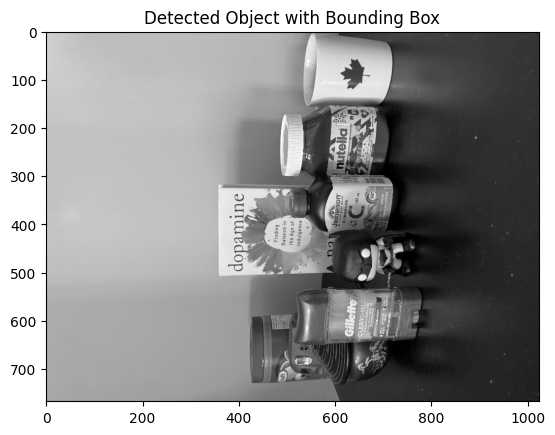

Object detected: True


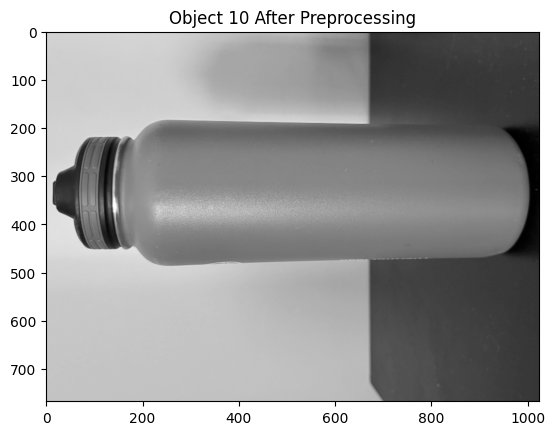

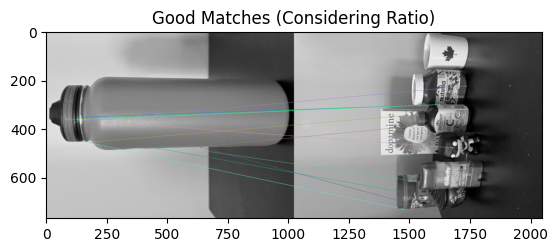

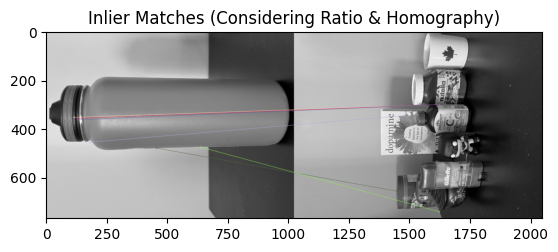

Total Keypoints: 94, Good Matches: 11, Inliers: 6, Inlier Ratio: 0.55, Match Ratio: 0.12


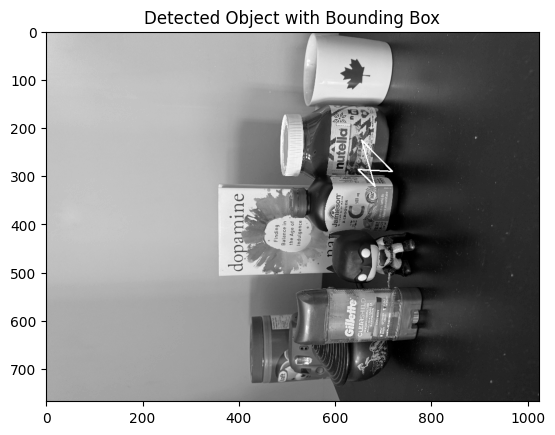

Object detected: True


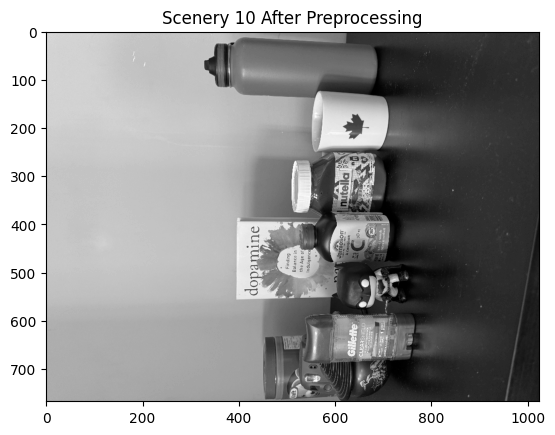

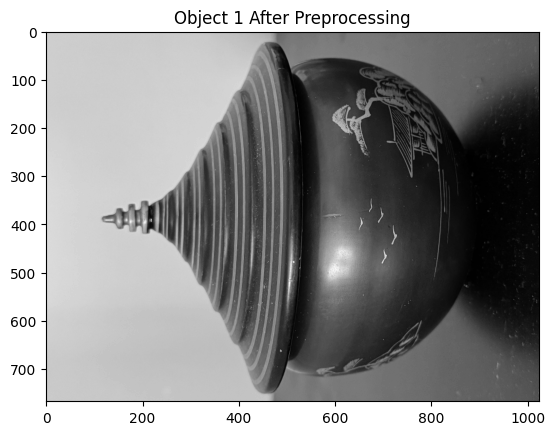

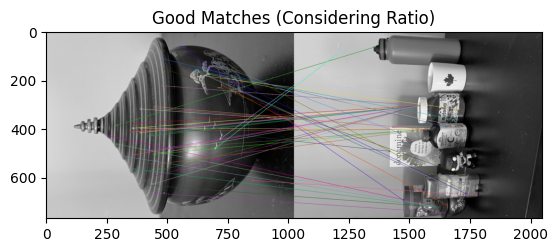

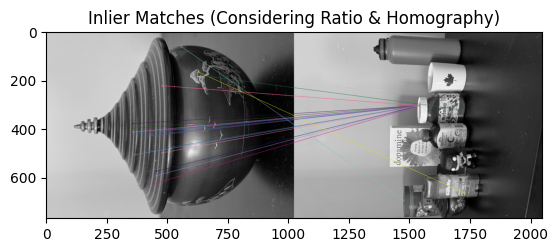

Total Keypoints: 897, Good Matches: 48, Inliers: 18, Inlier Ratio: 0.38, Match Ratio: 0.05


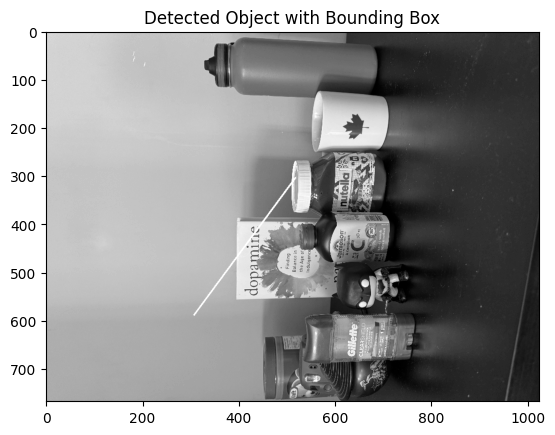

Object detected: False


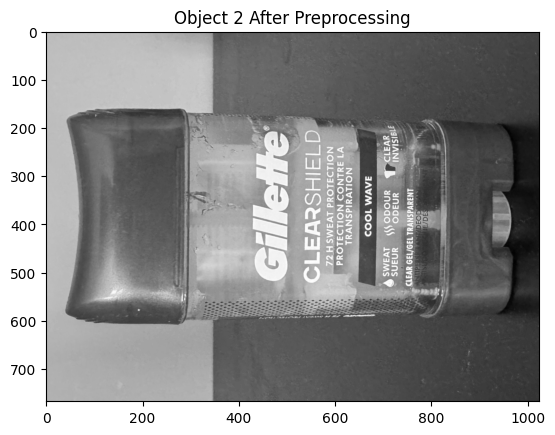

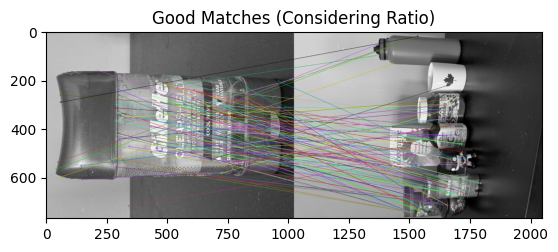

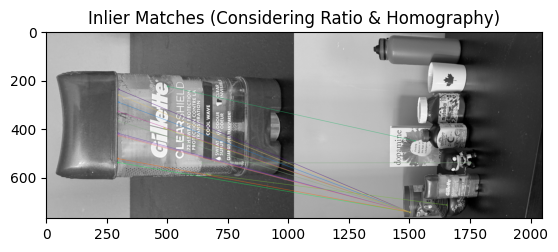

Total Keypoints: 2832, Good Matches: 134, Inliers: 14, Inlier Ratio: 0.10, Match Ratio: 0.05


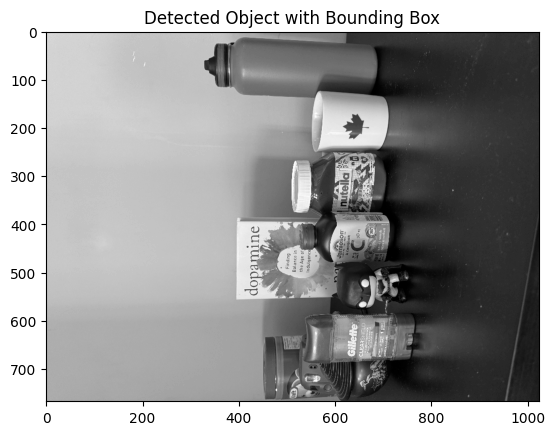

Object detected: True


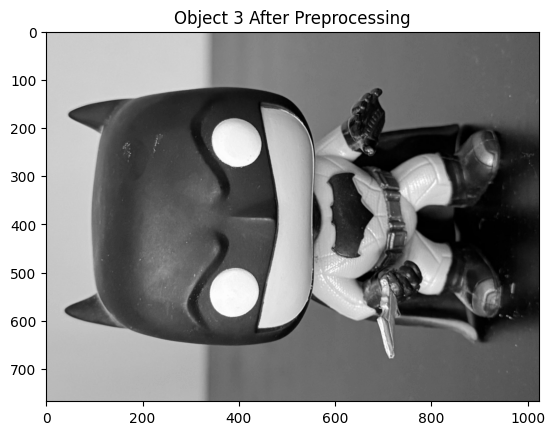

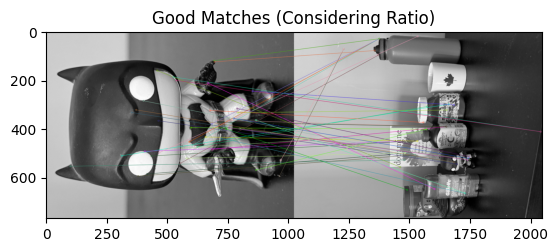

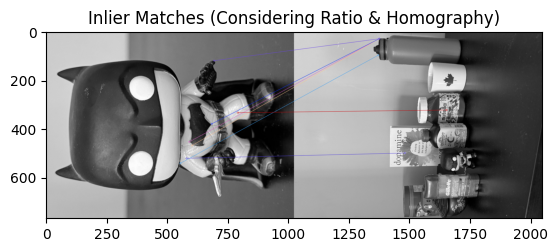

Total Keypoints: 1033, Good Matches: 42, Inliers: 7, Inlier Ratio: 0.17, Match Ratio: 0.04


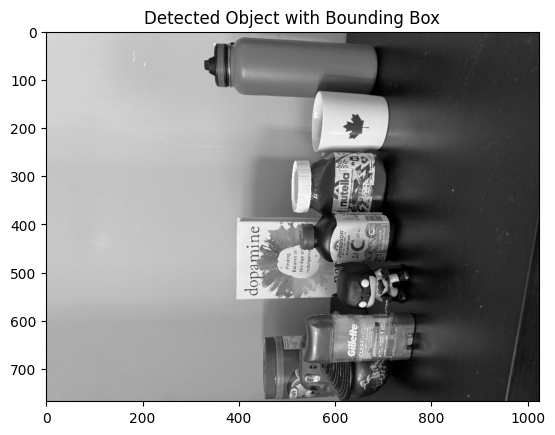

Object detected: False


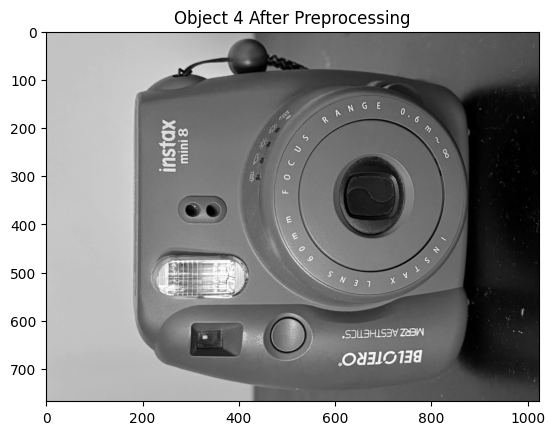

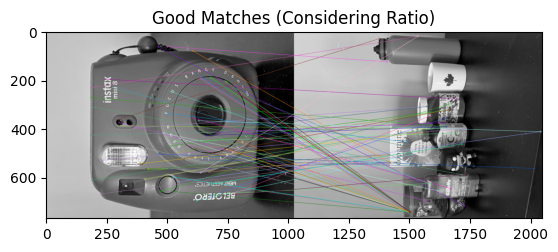

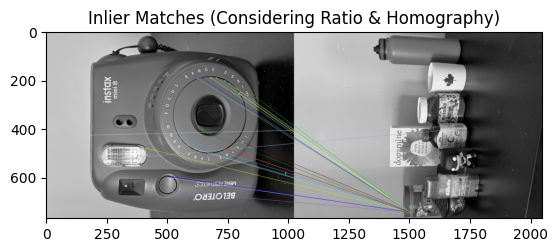

Total Keypoints: 1249, Good Matches: 73, Inliers: 24, Inlier Ratio: 0.33, Match Ratio: 0.06


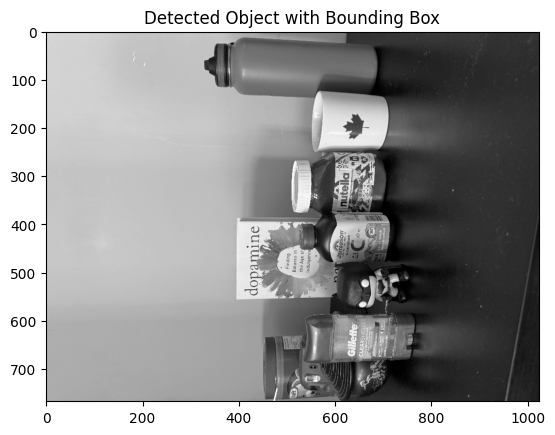

Object detected: False


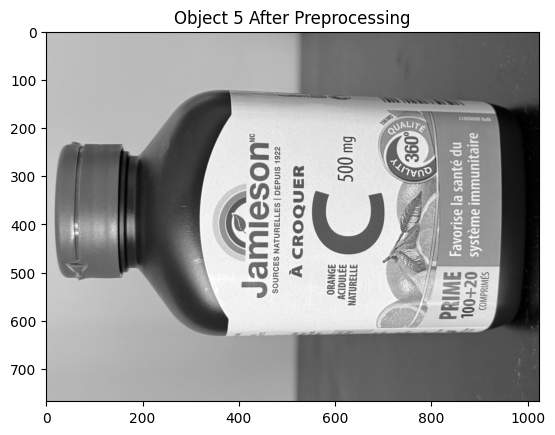

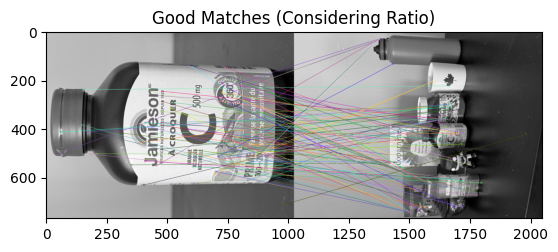

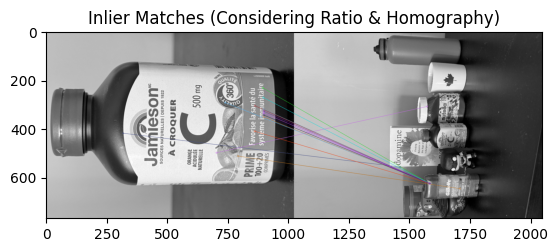

Total Keypoints: 2150, Good Matches: 100, Inliers: 13, Inlier Ratio: 0.13, Match Ratio: 0.05


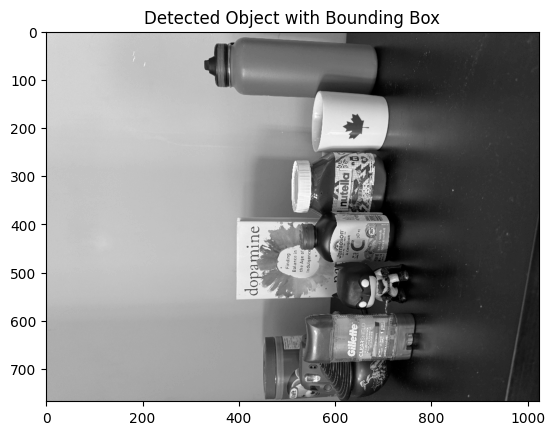

Object detected: False


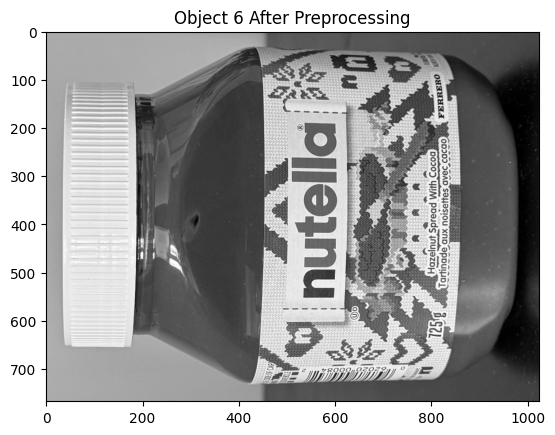

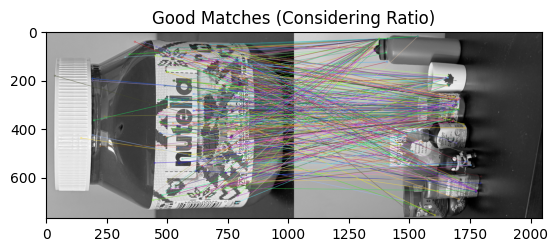

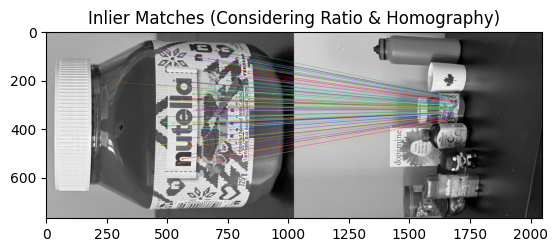

Total Keypoints: 6975, Good Matches: 323, Inliers: 78, Inlier Ratio: 0.24, Match Ratio: 0.05


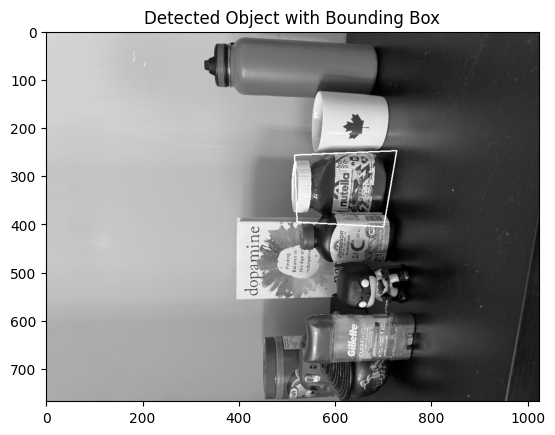

Object detected: True


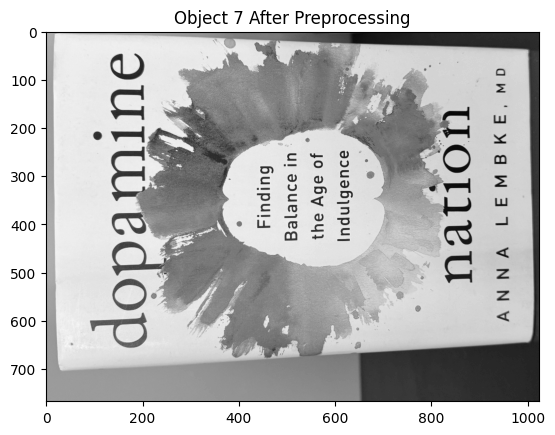

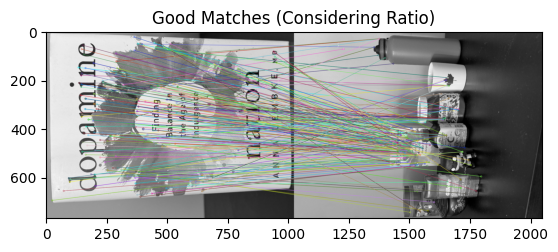

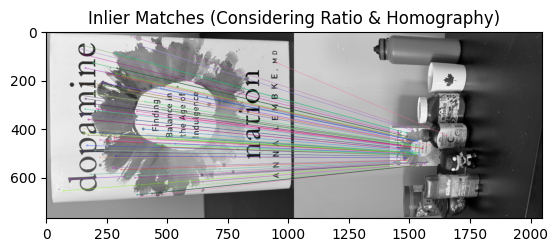

Total Keypoints: 1885, Good Matches: 272, Inliers: 102, Inlier Ratio: 0.38, Match Ratio: 0.14


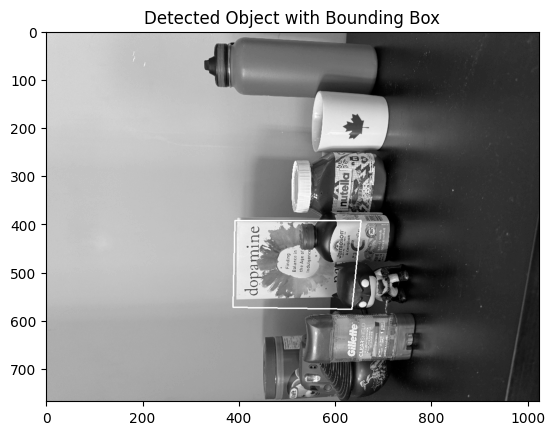

Object detected: True


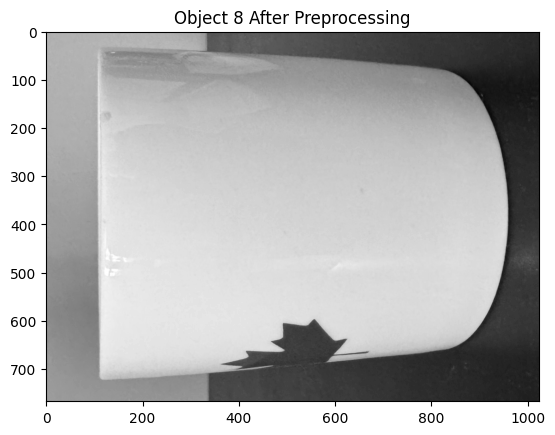

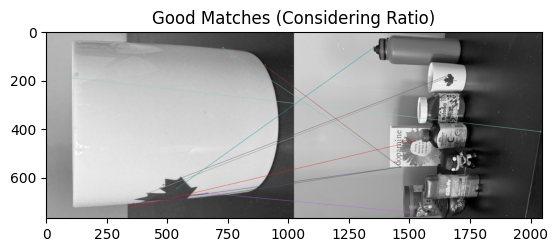

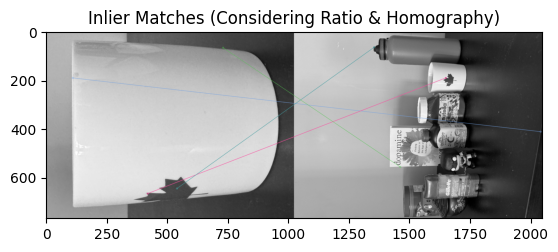

Total Keypoints: 90, Good Matches: 12, Inliers: 6, Inlier Ratio: 0.50, Match Ratio: 0.13


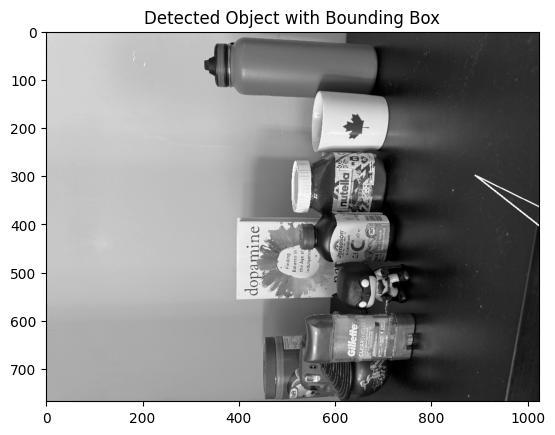

Object detected: True


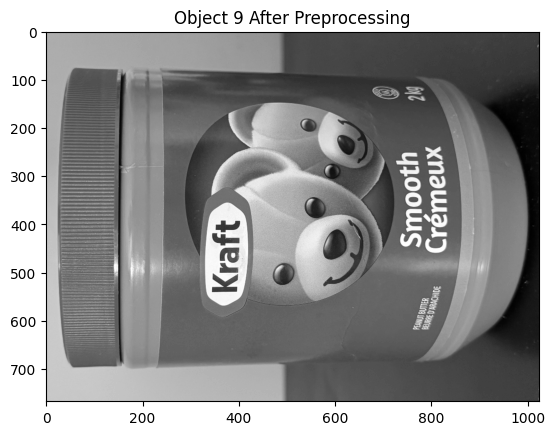

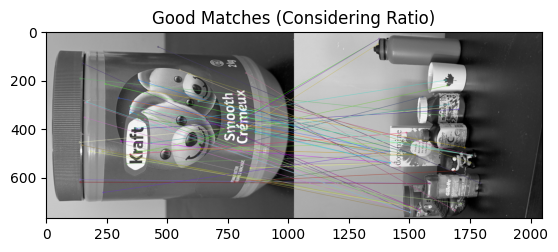

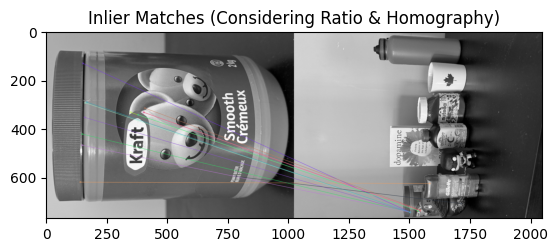

Total Keypoints: 1499, Good Matches: 64, Inliers: 15, Inlier Ratio: 0.23, Match Ratio: 0.04


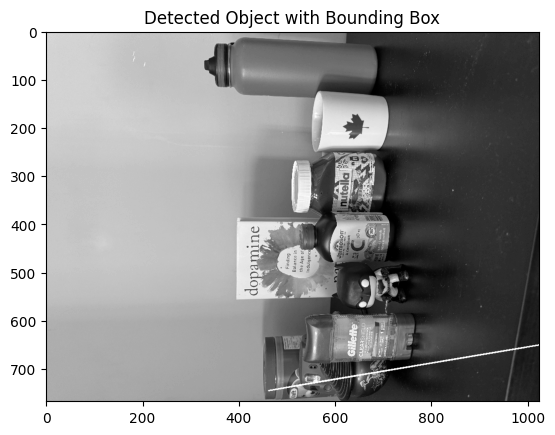

Object detected: False


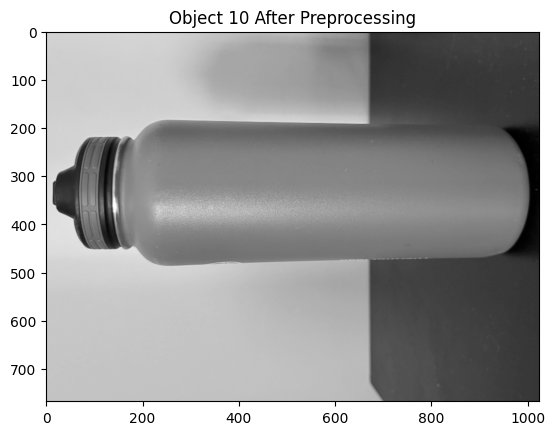

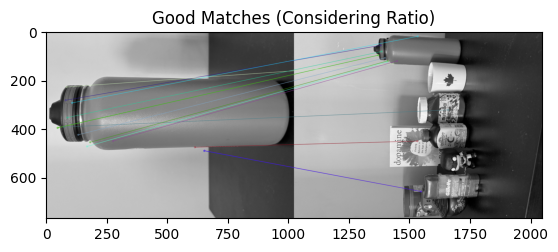

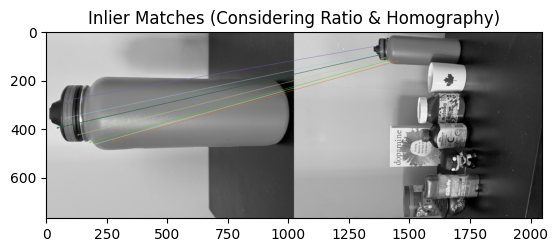

Total Keypoints: 94, Good Matches: 14, Inliers: 8, Inlier Ratio: 0.57, Match Ratio: 0.15


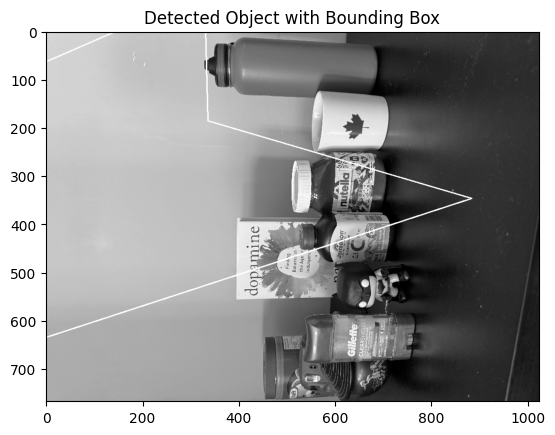

Object detected: True


In [5]:
# detect objects in each scene image

def preprocess_image(img):
    """
    resize, remove noise, and improve contrast of an object image before detecting features

    Params
    - img: numpy array representing object image

    Returns
    - img: preprocessed object image
    """
    img = cv2.resize(img, (1024, 768)) # maintain 4:3
    #img = cv2.equalizeHist(img) # equalize image to improve contrast
    #img = cv2.GaussianBlur(img, (13,13), 2) # blur to remove noise
    return img

def detect_object(O, S, threshold=0.1, ransac_threshold = 5.0):
    """
    Detects if object O is in scenery S

    Params
    O: numpy array representing object image
    S: numpy array representing scenery image
    threshold: percent of matches that should be inliers; defaults to 10%
    ransac_theshold = max distance (in terms of pixels) a point can be from homography to be an inlier; defaults to 5 pixels

    Returns
    True is object is detected, False otherwise
    """
    # extract features from each image using SIFT (SIFT is robust; it identifies key points and descriptors that are invariant to scale, rotation, etc.)
    sift = cv2.SIFT_create()
    key_pts_O, desc_O = sift.detectAndCompute(O, None) # key points = distinct regions in the image where repeatable and robust patterns exist, descriptors = vectors computed for each keypoint that describe the region around that keypoint 
    key_pts_S, desc_S = sift.detectAndCompute(S, None)

    # match descriptors using brute force matcher with default norm type for SIFT (NORM_L2 (i.e., euclidian distance))
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    matches = bf.knnMatch(desc_O, desc_S, k=2)  # for each descriptor in the object image, find the 2 closest neighbour descriptors in the scene image with the lowest euclidian distances (should we flip these?)

    # use ratio of distances to filter out ambiguous matches; if two descriptors are matched, their corresponding keypoints are considered 'matched keypoints'
    good_matches = []
    for m, n in matches:
        if m.distance < 0.8 * n.distance:  # 0.8 is the threshold mentioned in the slides; if distance of best match / distance of second best match is higher than 0.8, the match is ambiguous, so we disregard it
            good_matches.append(m) 

    # visualize key points corresponding to good matches; lines represent matches, dots represent key points (the flag ensures key points that haven't been matched don't show)
    matching_result = cv2.drawMatches(O, key_pts_O, S, key_pts_S, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(matching_result, cmap='gray')
    plt.title(f'Good Matches (Considering Ratio)')
    plt.show()

    # ensure matches are also geometrically consistent by estimating a homography matrix 
    if len(good_matches) < 4:
        return False # if we currently have less than 4 good matches, that is not sufficient since a min of 4 points is needed to compute homography matrix
    coord_O = np.float32([key_pts_O[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2) # this is an array where each element represents the coordinates (x,y) of a matched keypoint from the object image
    coord_S = np.float32([key_pts_S[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    hom_matrix, inliers = cv2.findHomography(coord_O, coord_S, cv2.RANSAC, ransac_threshold) # compute homography matrix (using RANSAC) and inliers that indicate which matches fit the homography within the specified threshold (threshold = max allowed error to classify point as inlier)
    inliers = inliers.ravel().tolist() # flatten; each element is a 1 (indicating the match is an inlier) or a 0 (indicating the match is an outlier)
    num_inliers = sum(inliers)
    inlier_matches = [good_matches[i] for i in range(len(good_matches)) if inliers[i] == 1]

    # visualize key points corresponding to inlier matches from good_matches
    matching_result = cv2.drawMatches(O, key_pts_O, S, key_pts_S, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(matching_result, cmap='gray')
    plt.title(f'Inlier Matches (Considering Ratio & Homography)')
    plt.show()

    # calculate ratios
    inlier_ratio = num_inliers / len(good_matches)
    match_ratio = len(good_matches) / len(key_pts_O)
    print(f"Total Keypoints: {len(key_pts_O)}, Good Matches: {len(good_matches)}, Inliers: {num_inliers}, Inlier Ratio: {inlier_ratio:.2f}, Match Ratio: {match_ratio:.2f}")

    # Draw bounding box
    h, w = O.shape
    corners_O = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2) # identify corners in the object image
    corners_S = cv2.perspectiveTransform(corners_O, hom_matrix) # apply homography matrix to map corners of object image to corresponding spots in scene image
    bounding_box = cv2.polylines(S.copy(), [np.int32(corners_S)], isClosed=True, color=(255, 255, 255), thickness=2) # draw box by connecting corners in scene image
    plt.imshow(bounding_box, cmap='gray')
    plt.title("Detected Object with Bounding Box")
    plt.show()

    return (inlier_ratio > threshold and match_ratio > 0.10) or len(good_matches) > 100 # conditions for determining if object is in scene image (still need to adjust)
    # Check if enough good matches exist in terms of the fraction of the object's keypoints that have good matches in the scene
    #match_ratio = len(good_matches) / len(key_pts_O)
    #return match_ratio > threshold
    #return len(good_matches) > 10 or match_ratio > threshold

# dict mapping each object to a name
object_names = {
    'O1': 'ornament',
    'O2': 'deodorant',
    'O3': 'batman',
    'O4': 'camera',
    'O5': 'vitamins',
    'O6': 'nutella',
    'O7': 'book',
    'O8': 'mug',
    'O9': 'peanut_butter',
    'O10': 'bottle'
}

# Open example object image and scenery
for j in range(8,10):
    S = cv2.imread(f'../Scenes/S{j+1}_right.jpg', cv2.IMREAD_GRAYSCALE)
    S = preprocess_image(S)
    plt.imshow(S, cmap='gray')
    plt.title(f'Scenery {j+1} After Preprocessing')
    plt.show()
    for i in range(0,10):
        O = cv2.imread(f'../Objects/O{i+1}.jpg', cv2.IMREAD_GRAYSCALE)
        O = preprocess_image(O)
        plt.imshow(O, cmap='gray')
        plt.title(f'Object {i+1} After Preprocessing')
        plt.show()
        detected = detect_object(O, S, 0.3, 5)
        print(f"Object detected: {detected}")


        # observations: images with text often get detected by the bounding box and have good keypoint matching; my suggestion is to replace the ornament, camera, water bottle, and mug with objects that either have more detail in terms of shapes/textures (like Batman) or have more text (like the book)

Scene 1, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 118, Inliers: 31, Inlier-Matches Ratio: 0.26, Inlier-Total Ratio: 0.03, Match Ratio: 0.13

Object: deodorant


C:\Users\krish\AppData\Local\Temp\ipykernel_23372\2215109450.py:169: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, pd.DataFrame([new_row])], ignore_index=True)


Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2851, Good Matches: 69, Inliers: 7, Inlier-Matches Ratio: 0.10, Inlier-Total Ratio: 0.00, Match Ratio: 0.02

Object: batman
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1033, Good Matches: 42, Inliers: 6, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.01, Match Ratio: 0.04

Object: camera
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 39, Inliers: 5, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.00, Match Ratio: 0.03

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 43, Inliers: 6, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.00, Match Ratio: 0.02

Object: nutella
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 6954, Good Matches: 172, Inliers: 8, Inlier-Matches Ratio: 0.05, Inlier-Total Ratio: 0.00, Match Ratio: 0.02

Object: book
Detection Prediction: False


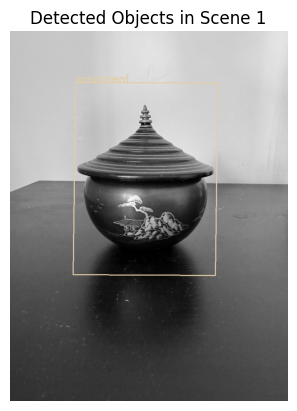

Scene 2, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 103, Inliers: 39, Inlier-Matches Ratio: 0.38, Inlier-Total Ratio: 0.04, Match Ratio: 0.11

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 264, Inliers: 121, Inlier-Matches Ratio: 0.46, Inlier-Total Ratio: 0.04, Match Ratio: 0.09

Object: batman
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1033, Good Matches: 50, Inliers: 7, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: camera
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 85, Inliers: 7, Inlier-Matches Ratio: 0.08, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 96, Inliers: 9, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.00, M

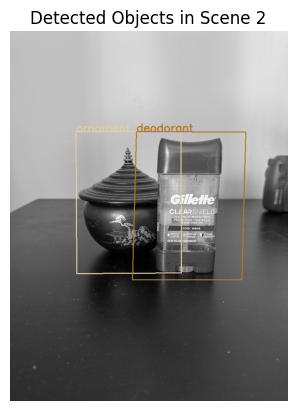

Scene 3, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 98, Inliers: 36, Inlier-Matches Ratio: 0.37, Inlier-Total Ratio: 0.04, Match Ratio: 0.11

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 254, Inliers: 111, Inlier-Matches Ratio: 0.44, Inlier-Total Ratio: 0.04, Match Ratio: 0.09

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 100, Inliers: 30, Inlier-Matches Ratio: 0.30, Inlier-Total Ratio: 0.03, Match Ratio: 0.10

Object: camera
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 75, Inliers: 7, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 87, Inliers: 15, Inlier-Matches Ratio: 0.17, Inlier-Total Ratio: 0.01, M

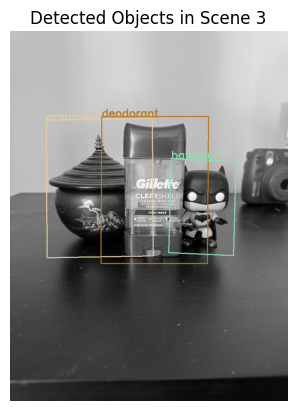

Scene 4, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 86, Inliers: 23, Inlier-Matches Ratio: 0.27, Inlier-Total Ratio: 0.03, Match Ratio: 0.09

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 258, Inliers: 117, Inlier-Matches Ratio: 0.45, Inlier-Total Ratio: 0.04, Match Ratio: 0.09

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 69, Inliers: 17, Inlier-Matches Ratio: 0.25, Inlier-Total Ratio: 0.02, Match Ratio: 0.07

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 102, Inliers: 13, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.01, Match Ratio: 0.08

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 92, Inliers: 8, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.00, Mat

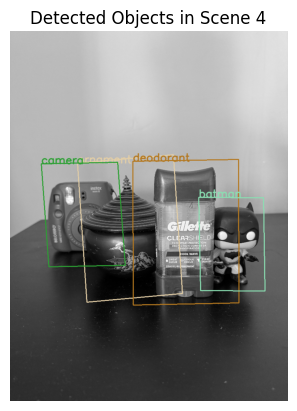

Scene 5, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 107, Inliers: 25, Inlier-Matches Ratio: 0.23, Inlier-Total Ratio: 0.03, Match Ratio: 0.12

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 301, Inliers: 123, Inlier-Matches Ratio: 0.41, Inlier-Total Ratio: 0.04, Match Ratio: 0.11

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 74, Inliers: 30, Inlier-Matches Ratio: 0.41, Inlier-Total Ratio: 0.03, Match Ratio: 0.07

Object: camera
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 123, Inliers: 11, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.01, Match Ratio: 0.10

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 179, Inliers: 42, Inlier-Matches Ratio: 0.23, Inlier-Total Ratio: 0.02, M

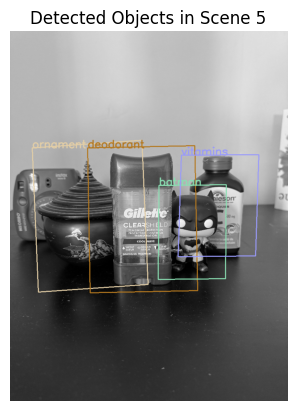

Scene 6, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 102, Inliers: 14, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.02, Match Ratio: 0.11

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 243, Inliers: 88, Inlier-Matches Ratio: 0.36, Inlier-Total Ratio: 0.03, Match Ratio: 0.09

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 89, Inliers: 17, Inlier-Matches Ratio: 0.19, Inlier-Total Ratio: 0.02, Match Ratio: 0.09

Object: camera
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 104, Inliers: 9, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.01, Match Ratio: 0.08

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 153, Inliers: 41, Inlier-Matches Ratio: 0.27, Inlier-Total Ratio: 0.02, Mat

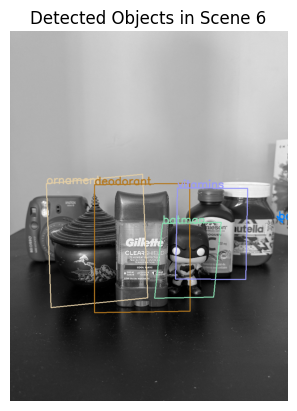

Scene 7, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 49, Inliers: 6, Inlier-Matches Ratio: 0.12, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 140, Inliers: 57, Inlier-Matches Ratio: 0.41, Inlier-Total Ratio: 0.02, Match Ratio: 0.05

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 68, Inliers: 8, Inlier-Matches Ratio: 0.12, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 77, Inliers: 9, Inlier-Matches Ratio: 0.12, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 117, Inliers: 27, Inlier-Matches Ratio: 0.23, Inlier-Total Ratio: 0.01, Match R

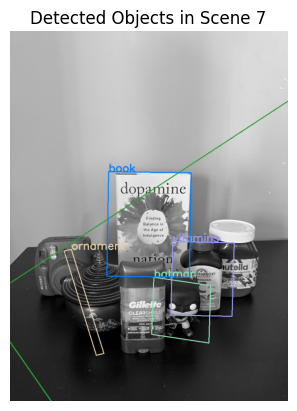

Scene 8, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 64, Inliers: 10, Inlier-Matches Ratio: 0.16, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 129, Inliers: 45, Inlier-Matches Ratio: 0.35, Inlier-Total Ratio: 0.02, Match Ratio: 0.05

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 69, Inliers: 22, Inlier-Matches Ratio: 0.32, Inlier-Total Ratio: 0.02, Match Ratio: 0.07

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 66, Inliers: 14, Inlier-Matches Ratio: 0.21, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 127, Inliers: 25, Inlier-Matches Ratio: 0.20, Inlier-Total Ratio: 0.01, Matc

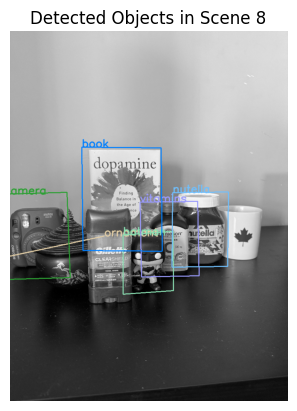

Scene 9, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 49, Inliers: 9, Inlier-Matches Ratio: 0.18, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 160, Inliers: 62, Inlier-Matches Ratio: 0.39, Inlier-Total Ratio: 0.02, Match Ratio: 0.06

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 57, Inliers: 16, Inlier-Matches Ratio: 0.28, Inlier-Total Ratio: 0.02, Match Ratio: 0.06

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 102, Inliers: 12, Inlier-Matches Ratio: 0.12, Inlier-Total Ratio: 0.01, Match Ratio: 0.08

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 110, Inliers: 25, Inlier-Matches Ratio: 0.23, Inlier-Total Ratio: 0.01, Match

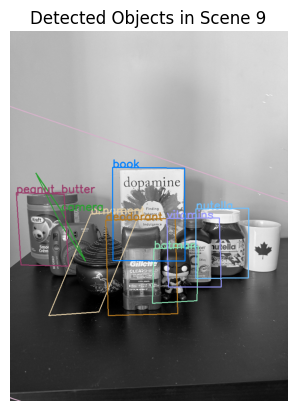

Scene 10, front
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 53, Inliers: 6, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 107, Inliers: 27, Inlier-Matches Ratio: 0.25, Inlier-Total Ratio: 0.01, Match Ratio: 0.04

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 73, Inliers: 21, Inlier-Matches Ratio: 0.29, Inlier-Total Ratio: 0.02, Match Ratio: 0.07

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 63, Inliers: 7, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 117, Inliers: 13, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match

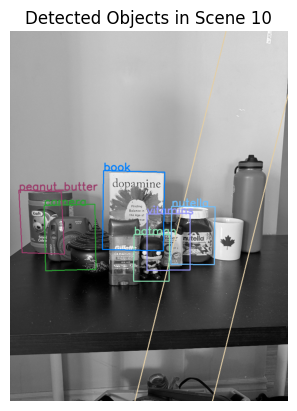

Scene 1, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 119, Inliers: 43, Inlier-Matches Ratio: 0.36, Inlier-Total Ratio: 0.05, Match Ratio: 0.13

Object: deodorant
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2851, Good Matches: 75, Inliers: 8, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.00, Match Ratio: 0.03

Object: batman
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1033, Good Matches: 53, Inliers: 5, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.00, Match Ratio: 0.05

Object: camera
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 62, Inliers: 17, Inlier-Matches Ratio: 0.27, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 87, Inliers: 8, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.00, Ma

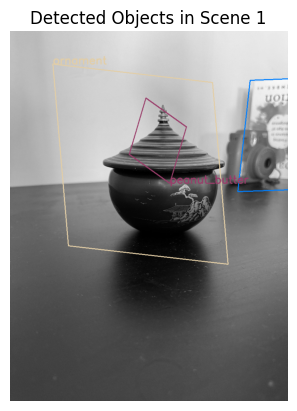

Scene 2, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 125, Inliers: 41, Inlier-Matches Ratio: 0.33, Inlier-Total Ratio: 0.05, Match Ratio: 0.14

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 163, Inliers: 28, Inlier-Matches Ratio: 0.17, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: batman
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1033, Good Matches: 37, Inliers: 6, Inlier-Matches Ratio: 0.16, Inlier-Total Ratio: 0.01, Match Ratio: 0.04

Object: camera
Detection Prediction: True
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 76, Inliers: 10, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 90, Inliers: 7, Inlier-Matches Ratio: 0.08, Inlier-Total Ratio: 0.00, Mat

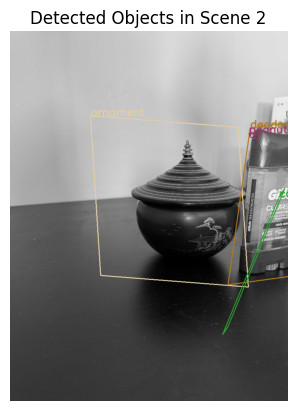

Scene 3, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 96, Inliers: 30, Inlier-Matches Ratio: 0.31, Inlier-Total Ratio: 0.03, Match Ratio: 0.11

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 190, Inliers: 32, Inlier-Matches Ratio: 0.17, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: batman
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 47, Inliers: 5, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.00, Match Ratio: 0.05

Object: camera
Detection Prediction: True
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 95, Inliers: 11, Inlier-Matches Ratio: 0.12, Inlier-Total Ratio: 0.01, Match Ratio: 0.08

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 103, Inliers: 7, Inlier-Matches Ratio: 0.07, Inlier-Total Ratio: 0.00, Matc

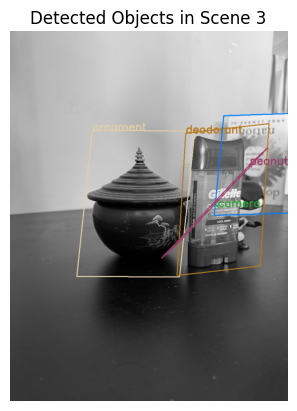

Scene 4, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 85, Inliers: 13, Inlier-Matches Ratio: 0.15, Inlier-Total Ratio: 0.01, Match Ratio: 0.09

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 153, Inliers: 24, Inlier-Matches Ratio: 0.16, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: batman
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 43, Inliers: 7, Inlier-Matches Ratio: 0.16, Inlier-Total Ratio: 0.01, Match Ratio: 0.04

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 102, Inliers: 22, Inlier-Matches Ratio: 0.22, Inlier-Total Ratio: 0.02, Match Ratio: 0.08

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 78, Inliers: 7, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.00, Match

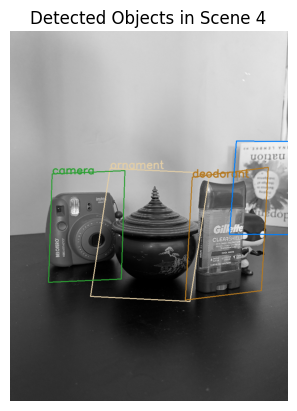

Scene 5, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 79, Inliers: 22, Inlier-Matches Ratio: 0.28, Inlier-Total Ratio: 0.02, Match Ratio: 0.09

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 149, Inliers: 23, Inlier-Matches Ratio: 0.15, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: batman
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 46, Inliers: 6, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.01, Match Ratio: 0.04

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 87, Inliers: 18, Inlier-Matches Ratio: 0.21, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 104, Inliers: 6, Inlier-Matches Ratio: 0.06, Inlier-Total Ratio: 0.00, Match 

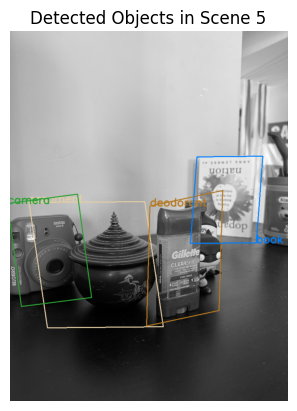

Scene 6, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 93, Inliers: 14, Inlier-Matches Ratio: 0.15, Inlier-Total Ratio: 0.02, Match Ratio: 0.10

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 119, Inliers: 22, Inlier-Matches Ratio: 0.18, Inlier-Total Ratio: 0.01, Match Ratio: 0.04

Object: batman
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 50, Inliers: 5, Inlier-Matches Ratio: 0.10, Inlier-Total Ratio: 0.00, Match Ratio: 0.05

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 129, Inliers: 19, Inlier-Matches Ratio: 0.15, Inlier-Total Ratio: 0.02, Match Ratio: 0.10

Object: vitamins
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 86, Inliers: 7, Inlier-Matches Ratio: 0.08, Inlier-Total Ratio: 0.00, Match

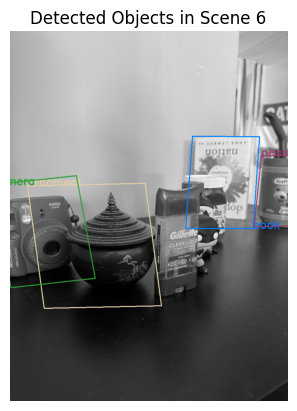

Scene 7, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 51, Inliers: 12, Inlier-Matches Ratio: 0.24, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 153, Inliers: 28, Inlier-Matches Ratio: 0.18, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: batman
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 46, Inliers: 6, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.01, Match Ratio: 0.04

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 86, Inliers: 18, Inlier-Matches Ratio: 0.21, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 78, Inliers: 8, Inlier-Matches Ratio: 0.10, Inlier-Total Ratio: 0.00, Match R

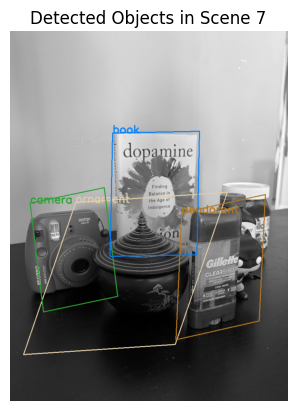

Scene 8, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 75, Inliers: 19, Inlier-Matches Ratio: 0.25, Inlier-Total Ratio: 0.02, Match Ratio: 0.08

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 137, Inliers: 22, Inlier-Matches Ratio: 0.16, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: batman
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 41, Inliers: 5, Inlier-Matches Ratio: 0.12, Inlier-Total Ratio: 0.00, Match Ratio: 0.04

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 93, Inliers: 12, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 95, Inliers: 7, Inlier-Matches Ratio: 0.07, Inlier-Total Ratio: 0.00, Match 

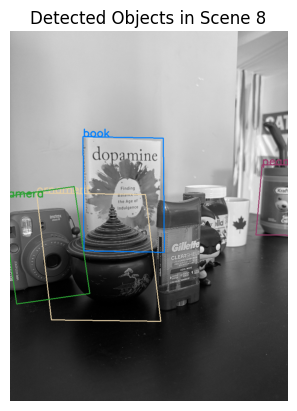

Scene 9, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 88, Inliers: 10, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.10

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 138, Inliers: 11, Inlier-Matches Ratio: 0.08, Inlier-Total Ratio: 0.00, Match Ratio: 0.05

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 57, Inliers: 12, Inlier-Matches Ratio: 0.21, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 103, Inliers: 14, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.01, Match Ratio: 0.08

Object: vitamins
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 108, Inliers: 7, Inlier-Matches Ratio: 0.06, Inlier-Total Ratio: 0.00, Matc

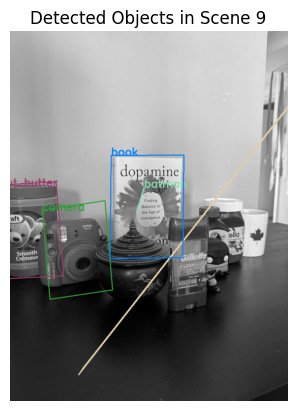

Scene 10, left
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 89, Inliers: 13, Inlier-Matches Ratio: 0.15, Inlier-Total Ratio: 0.01, Match Ratio: 0.10

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 140, Inliers: 7, Inlier-Matches Ratio: 0.05, Inlier-Total Ratio: 0.00, Match Ratio: 0.05

Object: batman
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 47, Inliers: 5, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.00, Match Ratio: 0.05

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 88, Inliers: 9, Inlier-Matches Ratio: 0.10, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 142, Inliers: 9, Inlier-Matches Ratio: 0.06, Inlier-Total Ratio: 0.00, Match 

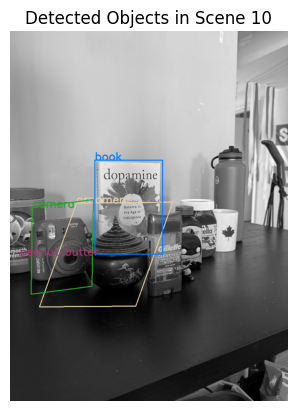

Scene 1, right
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 99, Inliers: 21, Inlier-Matches Ratio: 0.21, Inlier-Total Ratio: 0.02, Match Ratio: 0.11

Object: deodorant
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2851, Good Matches: 78, Inliers: 6, Inlier-Matches Ratio: 0.08, Inlier-Total Ratio: 0.00, Match Ratio: 0.03

Object: batman
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1033, Good Matches: 70, Inliers: 6, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: camera
Detection Prediction: True
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 73, Inliers: 13, Inlier-Matches Ratio: 0.18, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 72, Inliers: 14, Inlier-Matches Ratio: 0.19, Inlier-Total Ratio: 0.01, Ma

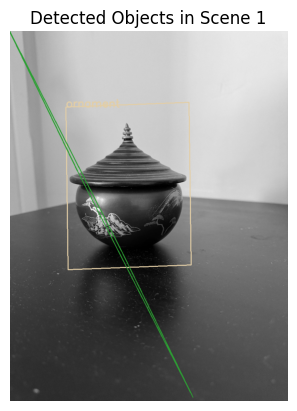

Scene 2, right
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 51, Inliers: 8, Inlier-Matches Ratio: 0.16, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 238, Inliers: 76, Inlier-Matches Ratio: 0.32, Inlier-Total Ratio: 0.03, Match Ratio: 0.08

Object: batman
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 1033, Good Matches: 31, Inliers: 4, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.00, Match Ratio: 0.03

Object: camera
Detection Prediction: True
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 66, Inliers: 9, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 73, Inliers: 7, Inlier-Matches Ratio: 0.10, Inlier-Total Ratio: 0.00, Match

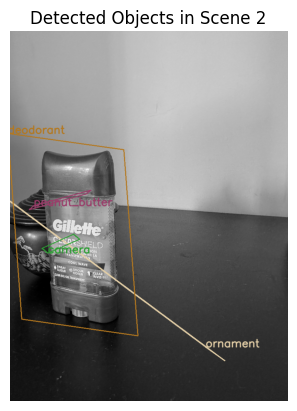

Scene 3, right
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 46, Inliers: 8, Inlier-Matches Ratio: 0.17, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 197, Inliers: 38, Inlier-Matches Ratio: 0.19, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 97, Inliers: 11, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.09

Object: camera
Detection Prediction: True
Actually in Scene? False
Total Keypoints: 1252, Good Matches: 125, Inliers: 18, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.01, Match Ratio: 0.10

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 100, Inliers: 7, Inlier-Matches Ratio: 0.07, Inlier-Total Ratio: 0.00, Mat

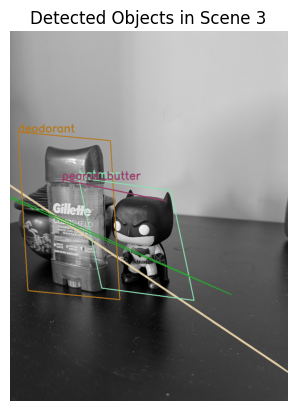

Scene 4, right
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 48, Inliers: 8, Inlier-Matches Ratio: 0.17, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 193, Inliers: 39, Inlier-Matches Ratio: 0.20, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 85, Inliers: 14, Inlier-Matches Ratio: 0.16, Inlier-Total Ratio: 0.01, Match Ratio: 0.08

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 93, Inliers: 13, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: False
Actually in Scene? False
Total Keypoints: 2154, Good Matches: 86, Inliers: 8, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.00, Match 

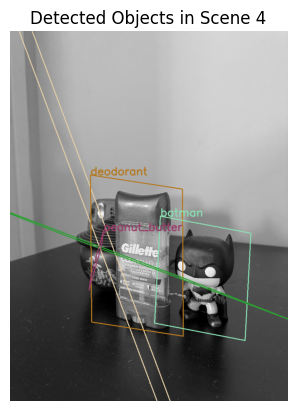

Scene 5, right
*************************
Object: ornament
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 910, Good Matches: 43, Inliers: 8, Inlier-Matches Ratio: 0.19, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 159, Inliers: 34, Inlier-Matches Ratio: 0.21, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 61, Inliers: 11, Inlier-Matches Ratio: 0.18, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: camera
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 75, Inliers: 7, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 178, Inliers: 58, Inlier-Matches Ratio: 0.33, Inlier-Total Ratio: 0.03, Match

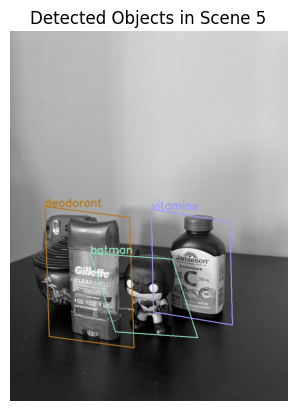

Scene 6, right
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 92, Inliers: 13, Inlier-Matches Ratio: 0.14, Inlier-Total Ratio: 0.01, Match Ratio: 0.10

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 164, Inliers: 21, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 53, Inliers: 6, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: camera
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 83, Inliers: 7, Inlier-Matches Ratio: 0.08, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 167, Inliers: 33, Inlier-Matches Ratio: 0.20, Inlier-Total Ratio: 0.02, Match 

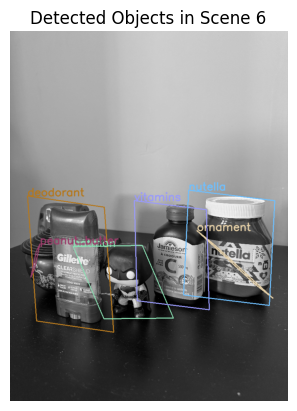

Scene 7, right
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 54, Inliers: 6, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 152, Inliers: 29, Inlier-Matches Ratio: 0.19, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 68, Inliers: 7, Inlier-Matches Ratio: 0.10, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: camera
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 71, Inliers: 7, Inlier-Matches Ratio: 0.10, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 146, Inliers: 43, Inlier-Matches Ratio: 0.29, Inlier-Total Ratio: 0.02, Match R

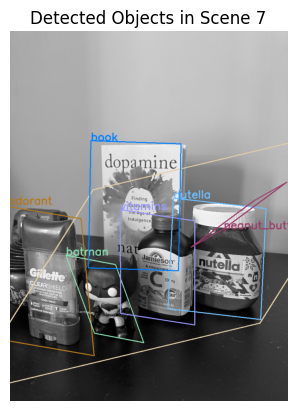

Scene 8, right
*************************
Object: ornament
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 910, Good Matches: 34, Inliers: 6, Inlier-Matches Ratio: 0.18, Inlier-Total Ratio: 0.01, Match Ratio: 0.04

Object: deodorant
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 157, Inliers: 18, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 57, Inliers: 12, Inlier-Matches Ratio: 0.21, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 107, Inliers: 20, Inlier-Matches Ratio: 0.19, Inlier-Total Ratio: 0.02, Match Ratio: 0.09

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 117, Inliers: 15, Inlier-Matches Ratio: 0.13, Inlier-Total Ratio: 0.01, Matc

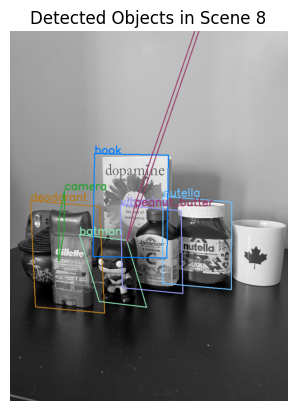

Scene 9, right
*************************
Object: ornament
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 910, Good Matches: 76, Inliers: 8, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.08

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 131, Inliers: 15, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: batman
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 55, Inliers: 6, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.01, Match Ratio: 0.05

Object: camera
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 87, Inliers: 15, Inlier-Matches Ratio: 0.17, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: True
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 136, Inliers: 21, Inlier-Matches Ratio: 0.15, Inlier-Total Ratio: 0.01, Match 

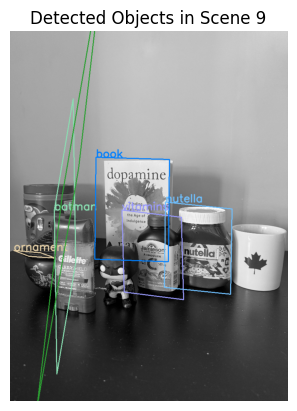

Scene 10, right
*************************
Object: ornament
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 910, Good Matches: 58, Inliers: 5, Inlier-Matches Ratio: 0.09, Inlier-Total Ratio: 0.01, Match Ratio: 0.06

Object: deodorant
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2851, Good Matches: 134, Inliers: 13, Inlier-Matches Ratio: 0.10, Inlier-Total Ratio: 0.00, Match Ratio: 0.05

Object: batman
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1033, Good Matches: 47, Inliers: 5, Inlier-Matches Ratio: 0.11, Inlier-Total Ratio: 0.00, Match Ratio: 0.05

Object: camera
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 1252, Good Matches: 86, Inliers: 7, Inlier-Matches Ratio: 0.08, Inlier-Total Ratio: 0.01, Match Ratio: 0.07

Object: vitamins
Detection Prediction: False
Actually in Scene? True
Total Keypoints: 2154, Good Matches: 121, Inliers: 8, Inlier-Matches Ratio: 0.07, Inlier-Total Ratio: 0.00, Mat

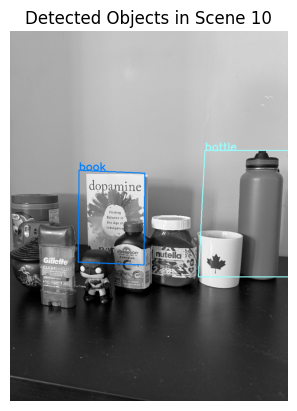

    Scene_ID    Object_Name   View Total_Keypoints Good_Matches Num_Inliers  \
0         S1       ornament  front             910          118          31   
1         S1      deodorant  front            2851           69           7   
2         S1         batman  front            1033           42           6   
3         S1         camera  front            1252           39           5   
4         S1       vitamins  front            2154           43           6   
..       ...            ...    ...             ...          ...         ...   
290      S10        nutella  right            6954          321          74   
291      S10           book  right            1894          248          89   
292      S10            mug  right              88           13           5   
293      S10  peanut_butter  right            1485           61           7   
294      S10         bottle  right              94           15           6   

     Inlier_Match_Ratio  Inlier_Total_Ratio  Match_

In [7]:
# detect objects in each scene image
'''
NOTES: above implementation worked terribly for scene images shot from the left or right. 
Why? when the scene image is shot at an angle, the homography matrix fails to capture the transformation properly. Also, even though SIFT is invariant to scale, rotation, etc., it struggles when the camera viewpoint is changed
Solution: instead of homography matrix, fit affline transfomation model with RANSAC. This is more robust to transformations involving skewing due to a changed camera angle.
'''

def preprocess_image(img):
    """
    resize, remove noise, and improve contrast of an object image before detecting features

    Params
    - img: numpy array representing object image

    Returns
    - img: preprocessed object image
    """
    img = cv2.resize(img, (1024, 768)) # maintain 4:3
    img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    #img = cv2.equalizeHist(img) # equalize image to improve contrast
    #img = cv2.GaussianBlur(img, (13,13), 2) # blur to remove noise
    return img

def detect_object(O, S, threshold=0.1, ransac_threshold = 5.0, visualize=False):
    """
    Detects if object O is in scenery S

    Params
    O: numpy array representing object image
    S: numpy array representing scenery image
    threshold: percent of matches that should be inliers; defaults to 10%
    ransac_theshold = max distance (in terms of pixels) a point can be from homography to be an inlier; defaults to 5 pixels
    visualize = boolean option to see intermediate steps of algorithm, defaults to False

    Returns
    detected: True is object is detected, False otherwise
    corners: list of bounding box corners for object in scene image, None otherwise
    results: list of detection stats for the object, None otherwise
    """
    # extract features from each image using SIFT (SIFT is robust; it identifies key points and descriptors that are invariant to scale, rotation, etc.)
    sift = cv2.SIFT_create()
    key_pts_O, desc_O = sift.detectAndCompute(O, None) # key points = distinct regions in the image where repeatable and robust patterns exist, descriptors = vectors computed for each keypoint that describe the region around that keypoint 
    key_pts_S, desc_S = sift.detectAndCompute(S, None)

    # match descriptors using brute force matcher with default norm type for SIFT (NORM_L2 (i.e., euclidian distance))
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    matches = bf.knnMatch(desc_O, desc_S, k=2)  # for each descriptor in the object image, find the 2 closest neighbour descriptors in the scene image with the lowest euclidian distances (should we flip these?)

    # use ratio of distances to filter out ambiguous matches; if two descriptors are matched, their corresponding keypoints are considered 'matched keypoints'
    good_matches = []
    for m, n in matches:
        if m.distance < 0.8 * n.distance:  # 0.8 is the threshold mentioned in the slides; if distance of best match / distance of second best match is higher than 0.8, the match is ambiguous, so we disregard it
            good_matches.append(m) 

    # visualize key points corresponding to good matches; lines represent matches, dots represent key points (the flag ensures key points that haven't been matched don't show)
    if visualize:
        matching_result = cv2.drawMatches(O, key_pts_O, S, key_pts_S, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(matching_result, cmap='gray')
        plt.title(f'Good Matches (Considering Ratio)')
        plt.show()

    # instead of estimating a homography matrix, estimate affline transformation to better capture objects at left/right camera angles
    if len(good_matches) < 4:
        print("Less than 4 good matches")
        return False, None, None # if we currently have less than 4 good matches, skip object
    coord_O = np.float32([key_pts_O[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2) # this is an array where each element represents the coordinates (x,y) of a matched keypoint from the object image
    coord_S = np.float32([key_pts_S[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    aff_matrix, inliers = cv2.estimateAffine2D(coord_O, coord_S, method=cv2.RANSAC, ransacReprojThreshold=ransac_threshold) # compute affline matrix (using RANSAC) and inliers that indicate which matches fit within the specified threshold (threshold = max allowed error to classify point as inlier)
    if aff_matrix is None:
        print("No affline matrix")
        return False, None, None # if we fail to compute a valid affline transformation, skip object
    inliers = inliers.ravel().tolist() # flatten; each element is a 1 (indicating the match is an inlier) or a 0 (indicating the match is an outlier)
    num_inliers = sum(inliers)
    inlier_matches = [good_matches[i] for i in range(len(good_matches)) if inliers[i] == 1]

    # visualize key points corresponding to inlier matches from good_matches
    if visualize:
        matching_result = cv2.drawMatches(O, key_pts_O, S, key_pts_S, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(matching_result, cmap='gray')
        plt.title(f'Inlier Matches (Considering Ratio & Affline)')
        plt.show()

    # calculate ratios
    inlier_match_ratio = num_inliers / len(good_matches)
    inlier_total_ratio = num_inliers/len(key_pts_O)
    match_ratio = len(good_matches) / len(key_pts_O)

    # Draw bounding box
    h, w = O.shape
    corners_O = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2) # identify corners in the object image
    corners_S = cv2.transform(corners_O, aff_matrix) # apply affline matrix to map corners of object image to corresponding spots in scene image
    if visualize:
        bounding_box = cv2.polylines(S.copy(), [np.int32(corners_S)], isClosed=True, color=(255, 255, 255), thickness=2) # draw box by connecting corners in scene image
        plt.imshow(bounding_box, cmap='gray')
        plt.title("Detected Object with Bounding Box")
        plt.show()

    #detected = (inlier_match_ratio > threshold and match_ratio > 0.10) or len(good_matches) > 100 # conditions for determining if object is in scene image (still need to adjust)
    detected = match_ratio >= 0.05 and inlier_match_ratio >= 0.1 and num_inliers > 5

    return detected, np.int32(corners_S), [len(key_pts_O), len(good_matches), num_inliers, inlier_match_ratio, inlier_total_ratio, match_ratio]
    # Check if enough good matches exist in terms of the fraction of the object's keypoints that have good matches in the scene
    #match_ratio = len(good_matches) / len(key_pts_O)
    #return match_ratio > threshold
    #return len(good_matches) > 10 or match_ratio > threshold

# dict mapping each object to a name
object_names = {
    'O1': 'ornament',
    'O2': 'deodorant',
    'O3': 'batman',
    'O4': 'camera',
    'O5': 'vitamins',
    'O6': 'nutella',
    'O7': 'book',
    'O8': 'mug',
    'O9': 'peanut_butter',
    'O10': 'bottle'
}

# Assign colour to each object for its bounding box
cmap = plt.get_cmap('Paired')
colours = [cmap(i / len(object_names))[:3] for i in range(len(object_names))]
colours = [tuple(int(255 * c) for c in color) for color in colours]
object_colors = {name: color for name, color in zip(object_names.values(), colours)}
#object_colors = {name: (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)) for name in object_names.values()} # map each object to a colour for its bounding box

# df to store results
results_df = pd.DataFrame(columns=["Scene_ID", "Object_Name", "View", "Total_Keypoints", "Good_Matches", 
                                   "Num_Inliers", "Inlier_Match_Ratio", "Inlier_Total_Ratio", 
                                   "Match_Ratio", "Predicted_Detection", "Actual_Detection"])

# Detect objects in scenes
for view in ['front', 'left', 'right']:
    for j in range(0,10):
        # Open scene
        S = cv2.imread(f'../Scenes/S{j+1}_{view}.jpg', cv2.IMREAD_GRAYSCALE)
        S = preprocess_image(S)
        detected_objects = []
        print(f"Scene {j+1}, {view}")
        print("*"*25)
        # Open object
        for i in range(0,10):
            O = cv2.imread(f'../Objects/O{i+1}.jpg', cv2.IMREAD_GRAYSCALE)
            O = preprocess_image(O)
            object_name = object_names[f'O{i+1}']
            print(f"Object: {object_name}")
            predicted_detection, bounding_box, results = detect_object(O, S, 0.3, 3, False) #determine if object exists in the scene and get bounding box corners for it
            actual_detection = i<=j
            print(f"Detection Prediction: {predicted_detection}\nActually in Scene? {actual_detection}")
            if results is not None:
                print(f"Total Keypoints: {results[0]}, Good Matches: {results[1]}, Inliers: {results[2]}, Inlier-Matches Ratio: {results[3]:.2f}, Inlier-Total Ratio: {results[4]:.2f}, Match Ratio: {results[5]:.2f}\n")
                new_row = {
                    "Scene_ID": f"S{j+1}",
                    "Object_Name": object_name,
                    "View": view,
                    "Total_Keypoints": results[0],
                    "Good_Matches": results[1],
                    "Num_Inliers": results[2],
                    "Inlier_Match_Ratio": results[3],
                    "Inlier_Total_Ratio": results[4],
                    "Match_Ratio": results[5],
                    "Predicted_Detection": predicted_detection,
                    "Actual_Detection": actual_detection
                }
                results_df = pd.concat([results_df, pd.DataFrame([new_row])], ignore_index=True)
            if predicted_detection and bounding_box is not None:
            #if bounding_box is not None:
                detected_objects.append((bounding_box, object_name))
        # Plot scene with boxes
        if detected_objects:
            scene_with_boxes = cv2.cvtColor(S, cv2.COLOR_GRAY2BGR)  # convert to colour
            for box, name in detected_objects:
                color = object_colors[name]
                scene_with_boxes = cv2.polylines(scene_with_boxes, [box], isClosed=True, color=color, thickness=2)
                # add label to box
                top_left = tuple(box[0][0]) 
                cv2.putText(
                    scene_with_boxes,
                    name,
                    top_left,
                    cv2.FONT_HERSHEY_SIMPLEX, # font
                    1,  # font size
                    color,  # same color as bounding box
                    2,  # thickness
                    cv2.LINE_AA
                )
            plt.imshow(cv2.cvtColor(scene_with_boxes, cv2.COLOR_BGR2RGB))
            plt.title(f"Detected Objects in Scene {j+1}")
            plt.axis("off")
            plt.show()

results_df.to_csv("detection_results.csv", index=False)
print(results_df)